In [1]:
import sys
import pandas as pd
import numpy as np
import sqlite3 as db
import time
import matplotlib.pyplot as plt
import csv
%matplotlib inline
import seaborn as sns

print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("sqlite3 version: {}".format(db.version))
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.metrics import silhouette_score
from sklearn.pipeline import make_pipeline

import warnings
warnings.simplefilter('ignore')

Python version: 3.7.4 (default, Aug  9 2019, 18:34:13) [MSC v.1915 64 bit (AMD64)]
pandas version: 0.25.1
numpy version: 1.16.5
sqlite3 version: 2.6.0


#melt table
def melt(dataframe, col_vals, key, value):
    assert type(dataframe) is pd.DataFrame
    ### BEGIN SOLUTION
    keep_vars = dataframe.columns.difference(col_vals)
    melted_sections = []
    for c in col_vals:
        melted_c = dataframe[keep_vars].copy()
        melted_c[key] = c
        melted_c[value] = dataframe[c]
        melted_sections.append(melted_c)
    melted = pd.concat(melted_sections)
    return melted
    ### END SOLUTION

In [2]:
df=pd.read_csv(r'C:\Users\chunxiacao\keenly\keenmins.csv',header=0)

In [4]:
df.head(2)

,PatientID,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate
0,5634263223369728,00:00,0.71,9.27,19.72
1,5634263223369728,00:01,0.07,4.85,19.09


In [5]:
df.columns

Index(['PatientID', 'Mins', 'MinsMovementFast', 'MinsMovementSlow',
       'MinsRespirationRate'],
      dtype='object')

In [3]:
X=df[['MinsMovementFast', 'MinsMovementSlow','MinsRespirationRate']]

In [7]:
df.shape

(29100, 5)

00:00:10.45


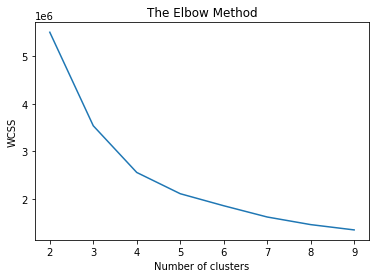

In [8]:
X=df[['MinsMovementFast', 'MinsMovementSlow','MinsRespirationRate']]

start = time.time()
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline

#plt.figure(figsize=(5, 3))
wcss = []
for i in range(2,10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_) #criterion based on which K-means clustering works
plt.plot(range(2,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
#plt.annotate(xy=(5,2.5),xytext = (5,3.5),s='Elbow', arrowprops={})
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:09:19.46


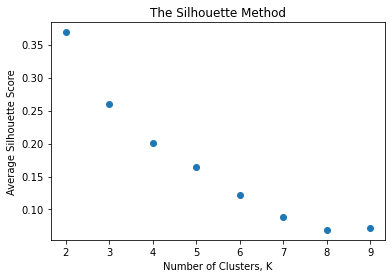

In [7]:
start = time.time()
# checking the best number of clusters (silhouette method)
sil=[]
for K in range(2,10):
   
    kmeans = KMeans(n_clusters=K)
    
    kmeans.fit(normalize(X))
    labels = kmeans.labels_
    sil.append(silhouette_score(X, labels, metric='euclidean'))

plt.scatter(range(2,10),sil,marker = 'o')
plt.xlabel('Number of Clusters, K')
plt.ylabel('Average Silhouette Score')
plt.title('The Silhouette Method')
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

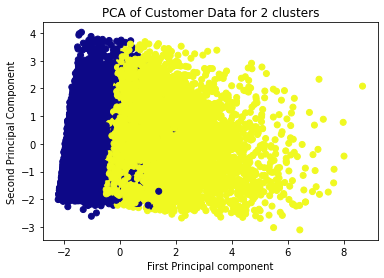

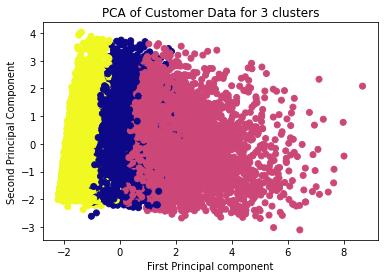

00:00:03.27


In [11]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
start = time.time()
for K in range(2,4):
    model = KMeans(n_clusters = K)
    model.fit_predict(X)
    pred=model.predict(X)
    #rescaling the data: scaled
    features = X
    scaler = StandardScaler()
    scaler.fit(features)
    scaled=scaler.transform(features)
    #initiating PCA classifier: pca
    pca = PCA(n_components=K);
    #fitting the scaled data
    pca.fit(scaled);
    #transforming fitted data into an array: x_pca
    x_pca = pca.transform(scaled)
    #creating a dataframe
    df2=pd.DataFrame({'cluster':pred,'x':x_pca[:,0],'y':x_pca[:,1]})
    df2.head()
    #plotting x,y 
    plt.scatter(df2.x,df2.y,c=df2.cluster,cmap='plasma');
    plt.xlabel('First Principal component');
    plt.ylabel('Second Principal Component');
    plt.title("PCA of Customer Data for {} clusters".format(K));
    plt.show()

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
    

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform( X )
cluster_range = range( 1, 12 )
cluster_errors = []

for num_clusters in cluster_range:
  clusters = KMeans( num_clusters )
  clusters.fit( X_scaled )
  cluster_errors.append( clusters.inertia_ )

clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )

clusters_df

#plt.figure(figsize=(16,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" );

In [5]:
clusters = KMeans(4, random_state = 42)  # 4 clusters!
clusters.fit( X )
clusters.cluster_centers_
clusters.labels_
df['clusters'] = clusters.labels_
df=df.sort_values(by=['PatientID','clusters', 'Mins'],ascending = (False, True,True))


In [6]:
df.head()

,PatientID,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate,clusters
27674,5756989665705984,00:01,1.62,42.75,15.33,0
27675,5756989665705984,00:02,1.38,38.88,18.80,0
27676,5756989665705984,00:03,4.42,41.79,18.36,0
27677,5756989665705984,00:04,4.61,43.50,17.91,0
27678,5756989665705984,00:05,1.34,36.70,16.96,0


dfp=df.copy()
rows=[]
rows0=[]
for i in list(set(dfp['PatientID'])):
    for j in list(set(dfp['clusters'])):
        rows.append(dfp[(dfp['clusters'] == j) & (dfp['PatientID'] == i)].head(1))
        rows0.append(dfp[(dfp['clusters'] == j) & (dfp['PatientID'] == i)].tail(1))

In [67]:
dfp=df.copy()
rows= pd.DataFrame([])
rows0= pd.DataFrame([])
for i in list(set(dfp['PatientID'])):
    for j in list(set(dfp['clusters'])):
        rows=rows.append(dfp[(dfp['clusters'] == j) & (dfp['PatientID'] == i)].head(1))
        rows0=rows0.append(dfp[(dfp['clusters'] == j) & (dfp['PatientID'] == i)].tail(1))

rowdf =pd.concat([rows,rows0])

rowdf=rowdf.sort_values(by=['PatientID','clusters', 'Mins'],ascending = (False, True,True)).reset_index(drop=True)

rowdf=rowdf[['PatientID', 'clusters', 'Mins', 'MinsMovementFast', 'MinsMovementSlow',
       'MinsRespirationRate']]

In [68]:
rowdf.head()

,PatientID,clusters,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate
0,5756989665705984,0,00:01,1.62,42.75,15.33
1,5756989665705984,0,23:57,1.70,43.68,11.43
2,5756989665705984,1,00:00,1.67,55.99,14.44
3,5756989665705984,1,23:59,2.41,47.05,17.22
4,5756989665705984,2,01:59,0.45,21.03,12.40


In [8]:
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
    

00:10:03.62


clusters = KMeans(5)  # 2 clusters!
clusters.fit( X )
clusters.cluster_centers_
clusters.labels_
df['Crime_clusters'] = clusters.labels_
df.sort_values(by=['Crime_clusters'],ascending = True)

00:00:13.26


<Figure size 7200x7200 with 0 Axes>

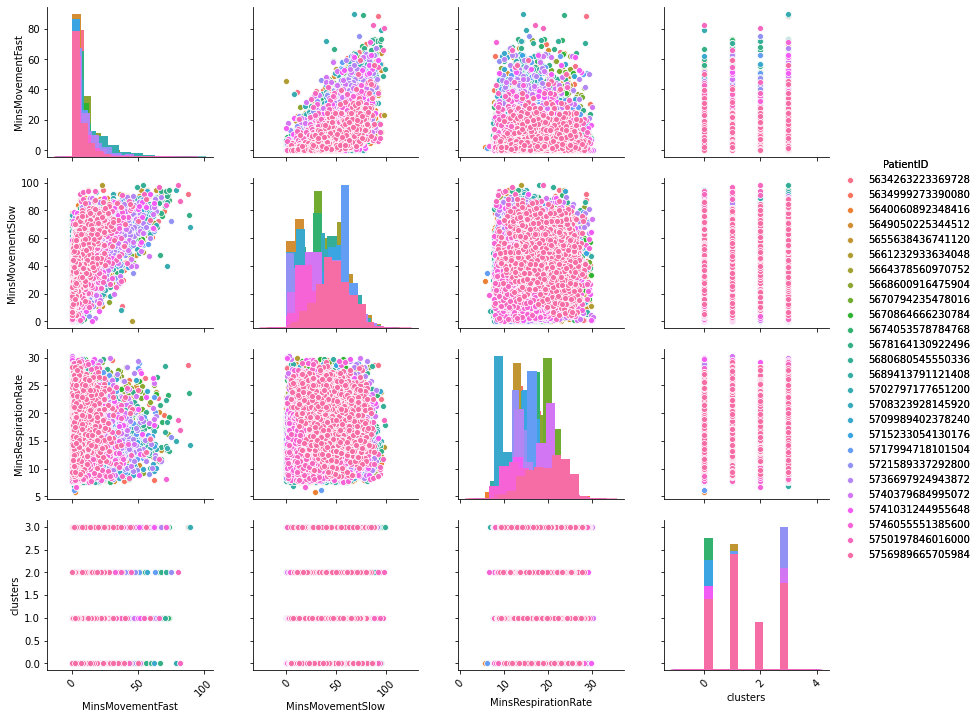

In [29]:
#df['clusters'] = labels
numerical =df.drop(columns='Mins')
numerical["clusters"]= numerical["clusters"].astype('category').cat.as_ordered()
numerical["PatientID"]= numerical["PatientID"].astype('category').cat.as_ordered()
start = time.time()
plt.figure(figsize = (100,100))
g = sns.pairplot(numerical, vars=numerical.loc[:, numerical.columns != "PatientID"], hue="PatientID") 
g.map_diag(plt.hist) 
for ax in g.axes.flat: 
    plt.setp(ax.get_xticklabels(), rotation=45) 
g.add_legend() 
g.set(alpha=0.5)
#plt.savefig("seaborn_pair_plot_single_alldata.png")
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

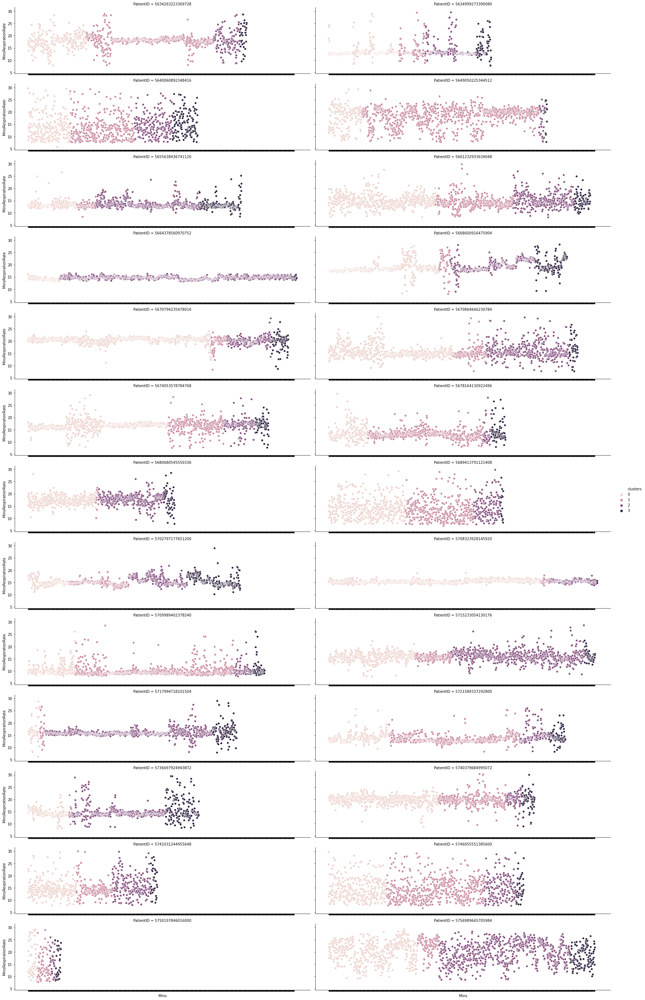

In [15]:
g=sns.relplot(x="Mins", y='MinsRespirationRate', hue='clusters',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])

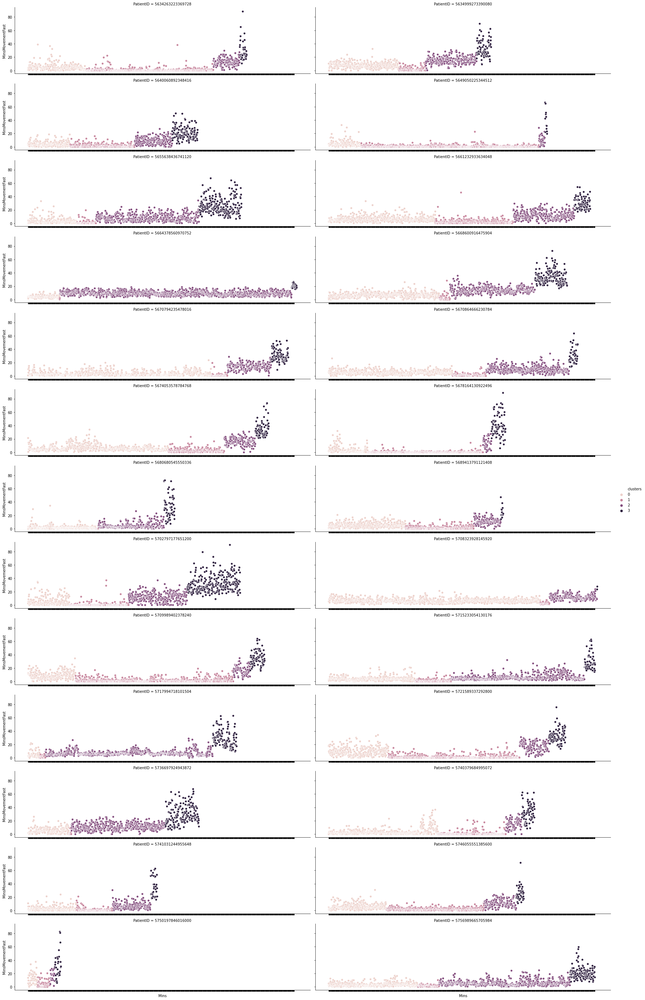

In [16]:
g=sns.relplot(x="Mins", y='MinsMovementFast', hue='clusters',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)

g.set(xticklabels=[])

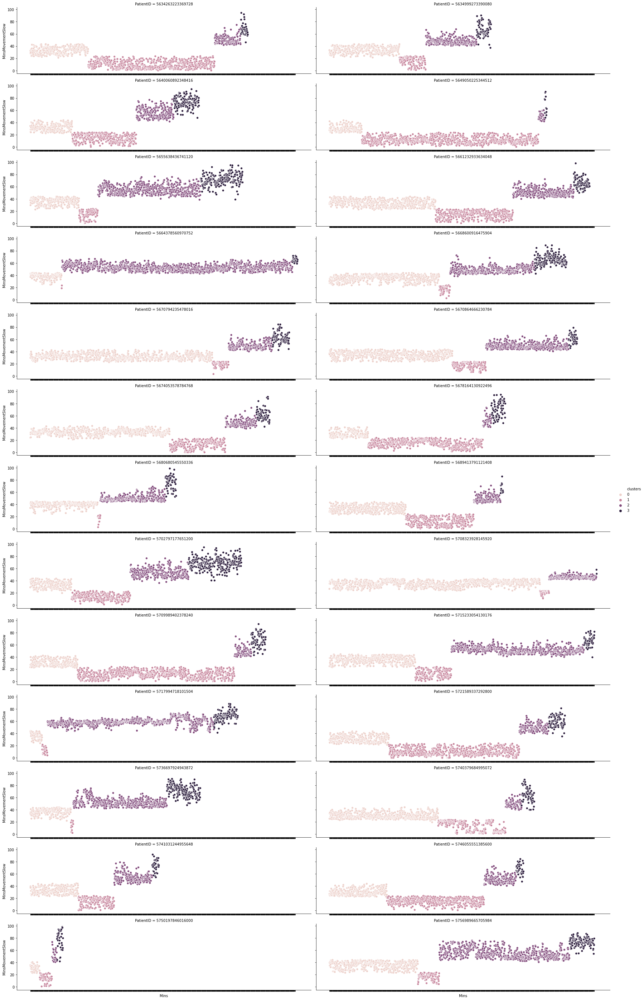

In [17]:
g=sns.relplot(x="Mins", y='MinsMovementSlow', hue='clusters',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])

In [48]:
list(set(df['clusters']))

[0, 1, 2, 3]

In [16]:
dfp=df.copy()
dfp.columns

Index(['PatientID', 'Mins', 'MinsMovementFast', 'MinsMovementSlow',
       'MinsRespirationRate', 'clusters'],
      dtype='object')

In [8]:
df.columns

Index(['PatientID', 'Mins', 'MinsMovementFast', 'MinsMovementSlow',
       'MinsRespirationRate', 'clusters'],
      dtype='object')

In [17]:
dfp=dfp.rename(columns={"MinsMovementFast": "MF", "MinsMovementSlow": "MS",'MinsRespirationRate': 'Rr', 'clusters': 'Cl'})

In [18]:
dfp.columns

Index(['PatientID', 'Mins', 'MF', 'MS', 'Rr', 'Cl'], dtype='object')

In [22]:
for i in list(set(dfp['PatientID'])):
    for j in list(set(dfp['Cl'])):
        print(dfp.loc[(dfp['Cl'] == j) & (dfp['PatientID'] == i)].head(1))

            PatientID   Mins     MF     MS     Rr  Cl
149  5634263223369728  02:36  11.47  53.82  18.07   0
          PatientID   Mins    MF    MS     Rr  Cl
0  5634263223369728  00:00  0.71  9.27  19.72   1
          PatientID   Mins    MF     MS     Rr  Cl
6  5634263223369728  00:06  1.63  27.42  17.58   2
            PatientID   Mins     MF    MS     Rr  Cl
270  5634263223369728  04:44  10.55  77.4  17.94   3
             PatientID   Mins     MF     MS     Rr  Cl
1172  5634999273390080  00:00  11.73  56.22  12.63   0
             PatientID   Mins    MF     MS    Rr  Cl
1178  5634999273390080  00:08  2.58  15.56  14.8   1
             PatientID   Mins    MF     MS     Rr  Cl
1177  5634999273390080  00:07  2.02  23.21  21.05   2
             PatientID   Mins     MF     MS     Rr  Cl
1174  5634999273390080  00:03  36.33  75.06  19.38   3
             PatientID   Mins     MF     MS     Rr  Cl
4130  5655638436741120  00:09  13.16  57.56  12.77   0
             PatientID   Mins    MF    M

18655  5709989402378240  00:01  38.22  51.17  9.22   3
              PatientID   Mins     MF     MS     Rr  Cl
22470  5721589337292800  00:02  23.81  51.48  15.33   0
              PatientID   Mins    MF   MS    Rr  Cl
22468  5721589337292800  00:00  0.14  7.0  14.8   1
              PatientID   Mins     MF     MS     Rr  Cl
22469  5721589337292800  00:01  10.69  32.89  15.38   2
              PatientID   Mins     MF     MS     Rr  Cl
22498  5721589337292800  00:30  30.99  58.45  14.38   3
              PatientID   Mins    MF     MS     Rr  Cl
23739  5736697924943872  01:06  3.51  51.38  21.63   0
              PatientID   Mins   MF     MS     Rr  Cl
23774  5736697924943872  02:16  0.0  16.54  16.17   1
              PatientID   Mins    MF     MS     Rr  Cl
23737  5736697924943872  00:34  20.8  29.48  11.32   2
              PatientID   Mins     MF     MS     Rr  Cl
23738  5736697924943872  01:04  59.72  82.74  14.53   3
              PatientID   Mins     MF     MS    Rr  Cl
24656  574

In [25]:
for i in list(set(dfp['PatientID'])):
    for j in list(set(dfp['Cl'])):
        print(dfp.loc[(dfp['Cl'] == j) & (dfp['PatientID'] == i)].tail(1))



             PatientID   Mins     MF     MS     Rr  Cl
1108  5634263223369728  22:56  12.51  44.23  18.64   0
             PatientID   Mins   MF     MS     Rr  Cl
1171  5634263223369728  23:59  0.0  13.68  19.91   1
             PatientID   Mins     MF     MS    Rr  Cl
1169  5634263223369728  23:57  11.45  39.97  19.1   2
             PatientID   Mins     MF    MS     Rr  Cl
1086  5634263223369728  22:34  20.96  60.8  17.53   3
             PatientID   Mins    MF     MS     Rr  Cl
2039  5634999273390080  22:57  25.6  47.11  24.49   0
             PatientID   Mins    MF    MS     Rr  Cl
2041  5634999273390080  23:54  0.26  19.5  13.13   1
             PatientID   Mins    MF     MS     Rr  Cl
2040  5634999273390080  23:30  0.04  27.51  23.62   2
             PatientID   Mins     MF     MS    Rr  Cl
2042  5634999273390080  23:58  27.84  59.24  17.2   3
             PatientID   Mins    MF     MS     Rr  Cl
5265  5655638436741120  23:58  5.16  53.06  13.04   0
             PatientID   Mins 

27667  5750197846016000  23:03  5.83  10.78  12.91   1
              PatientID   Mins     MF     MS     Rr  Cl
27662  5750197846016000  22:46  13.55  35.44  11.72   2
              PatientID   Mins     MF    MS    Rr  Cl
27672  5750197846016000  23:19  17.45  94.1  8.99   3
              PatientID   Mins    MF     MS     Rr  Cl
29099  5756989665705984  23:59  2.41  47.05  17.22   0
              PatientID   Mins    MF    MS     Rr  Cl
28759  5756989665705984  18:19  0.63  23.6  15.14   1
              PatientID   Mins   MF     MS     Rr  Cl
29097  5756989665705984  23:57  1.7  43.68  11.43   2
              PatientID   Mins     MF     MS     Rr  Cl
29065  5756989665705984  23:25  10.71  76.15  16.87   3


In [ ]:
#creat table for clusters start and end time
head=pd.read_csv('head.csv',header=0)
head.head()

tail=pd.read_csv('tail.csv',header=0)
tail.head()

clustersfile=head.merge(tail, on=['PatientID', 'clusters'])



clustersfile.columns = clustersfile.columns.str.replace('head', 'Start')

clustersfile.columns = clustersfile.columns.str.replace('tail', 'end')

clustersfile.columns = clustersfile.columns.str.replace("MF","MinsMovementFast")

clustersfile.columns = clustersfile.columns.str.replace("MS","MinsMovementSlow")

clustersfile.columns = clustersfile.columns.str.replace('Rr', 'RespirationRate')

clustersfile = clustersfile.reindex(sorted(clustersfile.columns), axis=1)

clustersfile=clustersfile[['PatientID', 'clusters', 'Mins_head',       'Mins_tail', 'MinsMovementFast_head', 'MinsMovementFast_tail',
       'MinsMovementSlow_head', 'MinsMovementSlow_tail',  'RespirationRate_head',
       'RespirationRate_tail']]

clustersfile=clustersfile.sort_values(by=['PatientID','clusters'],ascending = (False, True))
clustersfile.to_csv(r'C:\Users\chunxiacao\keenly\clustersfile.csv', index = None, header=True)

clustersfile=pd.read_csv(r'C:\Users\chunxiacao\keenly\clustersfile.csv',header=0)

clustersfile.head()

In [70]:
clustersfile

,PatientID,clusters,Mins_Start,Mins_end,MinsMovementFast_Start,MinsMovementFast_end,MinsMovementSlow_Start,MinsMovementSlow_end,RespirationRate_Start,RespirationRate_end
0,5756989665705980,0,0:00,23:59,1.67,2.41,55.99,47.05,14.44,17.22
1,5756989665705980,1,1:59,18:19,0.45,0.63,21.03,23.60,12.40,15.14
2,5756989665705980,2,0:01,23:57,1.62,1.70,42.75,43.68,15.33,11.43
3,5756989665705980,3,1:04,23:25,29.87,10.71,68.59,76.15,14.79,16.87
4,5750197846016000,0,0:18,23:18,10.11,4.62,48.00,49.10,16.75,14.66
...,...,...,...,...,...,...,...,...,...,...
99,5634999273390080,3,0:03,23:58,36.33,27.84,75.06,59.24,19.38,17.20
100,5634263223369720,0,2:36,22:56,11.47,12.51,53.82,44.23,18.07,18.64
101,5634263223369720,1,0:00,23:59,0.71,0.00,9.27,13.68,19.72,19.91
102,5634263223369720,2,0:06,23:57,1.63,11.45,27.42,39.97,17.58,19.10


In [73]:
def melt(df, col_vals, key, value):
    assert type(df) is pd.DataFrame
    ### BEGIN SOLUTION
    keep_vars = df.columns.difference(col_vals)
    melted_sections = []
    for c in col_vals:
        melted_c = df[keep_vars].copy()
        melted_c[key] = c
        melted_c[value] = df[c]
        melted_sections.append(melted_c)
    melted = pd.concat(melted_sections)
    return melted

In [132]:
clustersfile.columns

Index(['PatientID', 'clusters', 'Mins_Start', 'Mins_end',
       'MinsMovementFast_Start', 'MinsMovementFast_end',
       'MinsMovementSlow_Start', 'MinsMovementSlow_end',
       'RespirationRate_Start', 'RespirationRate_end'],
      dtype='object')

In [131]:
m_4amin=clustersfile[['PatientID','clusters','Mins_Start', 'Mins_end']]
m_4amin.shape
m_4amin= melt(m_4amin, col_vals=['Mins_Start', 'Mins_end'], key='Mins', value='minsperiod')
m_4amin['Mins'] =m_4amin['Mins'].str.replace('Mins_', '')
m_4amin=m_4amin.sort_values(by=['PatientID','clusters'],ascending = (False, True))
m_4amin.head()

,PatientID,clusters,Mins,minsperiod
0,5756989665705980,0,Start,0:00
0,5756989665705980,0,end,23:59
1,5756989665705980,1,end,18:19
1,5756989665705980,1,Start,1:59
2,5756989665705980,2,Start,0:01


In [136]:
m_4MovementFast=clustersfile[['PatientID','clusters','MinsMovementFast_Start', 'MinsMovementFast_end']]
m_4MovementFast.shape
m_4MovementFast= melt(m_4MovementFast, col_vals=['MinsMovementFast_Start', 'MinsMovementFast_end'], key='Mins', value='MinsMovementFastperiod')
m_4MovementFast['Mins'] =m_4MovementFast['Mins'].str.replace('MinsMovementFast_', '')
m_4MovementFast=m_4MovementFast.sort_values(by=['PatientID','clusters'],ascending = (False, True))
m_4MovementFast.head()

,PatientID,clusters,Mins,MinsMovementFastperiod
0,5756989665705980,0,Start,1.67
0,5756989665705980,0,end,2.41
1,5756989665705980,1,Start,0.45
1,5756989665705980,1,end,0.63
2,5756989665705980,2,Start,1.62


In [ ]:
m_4MMovementSlow=clustersfile[['PatientID','clusters','MinsMovementSlow_Start', 'MinsMovementSlow_end']]
m_4MMovementSlow.shape
m_4MMovementSlow= melt(m_4MMovementSlow, col_vals=['MinsMovementSlow_Start', 'MinsMovementSlow_end'], key='Mins', value='MinsMMovementSlowperiod')

In [141]:
m_4MMovementSlow['Mins'] =m_4MMovementSlow['Mins'].str.replace('MinsMovementSlow_', '')
m_4MMovementSlow=m_4MMovementSlow.sort_values(by=['PatientID','clusters'],ascending = (False, True))
m_4MMovementSlow.head()

,PatientID,clusters,Mins,MinsMMovementSlowperiod
0,5756989665705980,0,Start,55.99
0,5756989665705980,0,end,47.05
1,5756989665705980,1,Start,21.03
1,5756989665705980,1,end,23.60
2,5756989665705980,2,Start,42.75


In [137]:
m_4=m_4MovementFast.merge(m_4amin,on=['PatientID','clusters','Mins'])
m_4.head()

,PatientID,clusters,Mins,MinsMovementFastperiod,minsperiod
0,5756989665705980,0,Start,1.67,0:00
1,5756989665705980,0,end,2.41,23:59
2,5756989665705980,1,Start,0.45,1:59
3,5756989665705980,1,end,0.63,18:19
4,5756989665705980,2,Start,1.62,0:01


In [142]:
m_4=m_4.merge(m_4MMovementSlow,on=['PatientID','clusters','Mins'])
m_4.head()

,PatientID,clusters,Mins,MinsMovementFastperiod,minsperiod,MinsMMovementSlowperiod
0,5756989665705980,0,Start,1.67,0:00,55.99
1,5756989665705980,0,end,2.41,23:59,47.05
2,5756989665705980,1,Start,0.45,1:59,21.03
3,5756989665705980,1,end,0.63,18:19,23.60
4,5756989665705980,2,Start,1.62,0:01,42.75


In [143]:
m_4.shape

(208, 6)

In [144]:
m_4RespirationRate=clustersfile[['PatientID','clusters','RespirationRate_Start', 'RespirationRate_end']]
m_4RespirationRate.shape
m_4RespirationRate= melt(m_4RespirationRate, col_vals=['RespirationRate_Start', 'RespirationRate_end'], key='Mins', value='RespirationRateperiod')
m_4RespirationRate['Mins'] =m_4RespirationRate['Mins'].str.replace('RespirationRate_', '')
m_4RespirationRate=m_4RespirationRate.sort_values(by=['PatientID','clusters'],ascending = (False, True))
m_4RespirationRate.head()

,PatientID,clusters,Mins,RespirationRateperiod
0,5756989665705980,0,Start,14.44
0,5756989665705980,0,end,17.22
1,5756989665705980,1,Start,12.40
1,5756989665705980,1,end,15.14
2,5756989665705980,2,Start,15.33


In [145]:
m_4=m_4.merge(m_4RespirationRate,on=['PatientID','clusters','Mins'])


,PatientID,clusters,Mins,MinsMovementFastperiod,minsperiod,MinsMMovementSlowperiod,RespirationRateperiod
0,5756989665705980,0,Start,1.67,0:00,55.99,14.44
1,5756989665705980,0,end,2.41,23:59,47.05,17.22
2,5756989665705980,1,Start,0.45,1:59,21.03,12.40
3,5756989665705980,1,end,0.63,18:19,23.60,15.14
4,5756989665705980,2,Start,1.62,0:01,42.75,15.33


In [147]:
m_4=m_4.replace({'Start':0, 'end':1})

In [151]:
m_4=m_4.rename(columns={"minsperiod": "S-Ttime", "MinsMovementFastperiod": "MovementFast","RespirationRateperiod": "RespirationRate","MinsMMovementSlowperiod": "MovementSlow"})

In [155]:
m_4.head()

,PatientID,clusters,Mins,MovementFast,S-Ttime,MovementSlow,RespirationRate
0,5756989665705980,0,0,1.67,0:00,55.99,14.44
4,5756989665705980,2,0,1.62,0:01,42.75,15.33
3,5756989665705980,1,1,0.63,18:19,23.60,15.14
6,5756989665705980,3,0,29.87,1:04,68.59,14.79
2,5756989665705980,1,0,0.45,1:59,21.03,12.40


In [154]:
m_4=m_4.sort_values(by=['PatientID','S-Ttime'],ascending = (False, True))

In [160]:
m_4.columns

Index(['PatientID', 'clusters', 'Mins', 'MovementFast', 'S-Ttime',
       'MovementSlow', 'RespirationRate'],
      dtype='object')

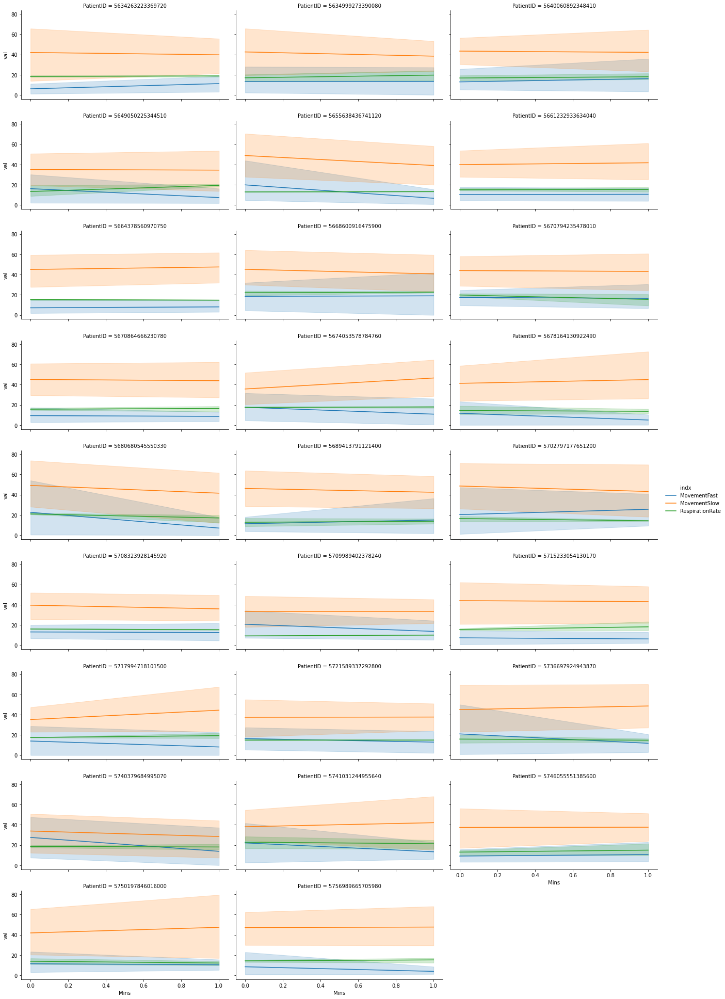

In [161]:
#m_dfHours=m_4[['PatientID', 'clusters', 'MovementFast', 'S-Ttime',
       #'MovementSlow', 'RespirationRate']]
m_dfHours = melt(m_4, col_vals=['MovementFast', 'MovementSlow',
       'RespirationRate'], key='indx', value='val')


g=sns.relplot(x="Mins", y='val',hue='indx',height=3, aspect=2,
              col="PatientID", data=m_dfHours,col_wrap=3, kind="line")

In [84]:
m_4a = melt(clustersfile, col_vals=['Mins_Start', 'Mins_end'], key='Mins', value='minsperiod')

m_4a.shape

(208, 10)

In [86]:
m_4a = melt(m_4a, col_vals=['MinsMovementFast_Start', 'MinsMovementFast_end'], key='MovementFast', value='value_MovementFast')

m_4a.shape

(416, 10)

In [88]:
m_4a = melt(m_4a, col_vals=['RespirationRate_Start', 'RespirationRate_end'], key='RespirationRate', value='value_RespirationRate')

m_4a.shape

(832, 10)

In [89]:
m_4a = melt(m_4a, col_vals=['MinsMovementSlow_Start', 'MinsMovementSlow_end'], key='MinsMovementSlow', value='value_MinsMovementSlow')

m_4a.shape

(1664, 10)

In [122]:
m_4a=m_4a.sort_values(by=['PatientID','clusters'],ascending = (False, True))

In [123]:
m_4a.duplicated().sum()

0

In [124]:
m_4a.head()

,Mins,MovementFast,PatientID,RespirationRate,clusters,minsperiod,value_MovementFast,value_RespirationRate,MinsMovementSlow,value_MinsMovementSlow
0,Start,Start,5756989665705980,Start,0,0:00,1.67,14.44,Start,55.99
0,end,Start,5756989665705980,Start,0,23:59,1.67,14.44,Start,55.99
0,Start,end,5756989665705980,Start,0,0:00,2.41,14.44,Start,55.99
0,end,end,5756989665705980,Start,0,23:59,2.41,14.44,Start,55.99
0,Start,Start,5756989665705980,end,0,0:00,1.67,17.22,Start,55.99


In [116]:
m_4a['MovementFast'] = m_4a['MovementFast'].str.replace('MinsMovementFast_', '')

In [118]:
m_4a['RespirationRate'] = m_4a['RespirationRate'].str.replace('RespirationRate_', '')

In [120]:
m_4a['MinsMovementSlow'] = m_4a['MinsMovementSlow'].str.replace('MinsMovementSlow_', '')

Index(['Mins', 'MovementFast', 'PatientID', 'RespirationRate', 'clusters',
       'minsperiod', 'value_MovementFast', 'value_RespirationRate',
       'MinsMovementSlow', 'value_MinsMovementSlow'],
      dtype='object')


for i in list(set(df['PatientID'])):
    for j in list(set(df['clusters'])):
        print(df.loc[(df['clusters'] == j) & (df['PatientID'] == i)].head(1))
        print(df.loc[(df['clusters'] == j) & (df['PatientID'] == i)].tail(1))

for i in list(set(df['PatientID'])):
    for j in list(set(df['clusters'])):
        print(df.loc[(df['clusters'] == j) & (df['PatientID'] == i)].head(1))

for i in list(set(df['PatientID'])):
    for j in list(set(df['clusters'])):
        #print(df.loc[(df['clusters'] == j) & (df['PatientID'] == i)].head(1))
        print(df.loc[(df['clusters'] == j) & (df['PatientID'] == i)].tail(1))

In [44]:
df.loc[(df['clusters'] == 0) & (df['PatientID'] == 5668600916475904)].iloc[0]

PatientID              5668600916475904
Mins                              08:58
MinsMovementFast                   2.12
MinsMovementSlow                  30.42
MinsRespirationRate               17.46
clusters                              0
Name: 8647, dtype: object

In [45]:
df.loc[(df['clusters'] == 0) & (df['PatientID'] == 5668600916475904)].head(1)

,PatientID,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate,clusters
8647,5668600916475904,08:58,2.12,30.42,17.46,0


In [46]:
df.loc[(df['clusters'] == 0) & (df['PatientID'] == 5668600916475904)].tail(1)

,PatientID,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate,clusters
9172,5668600916475904,20:16,3.38,37.83,17.38,0


In [35]:
conn = db.connect('df_trial2.db')
#c = conn.cursor()
df.to_sql('df', conn, if_exists='replace', index=False)
pd.read_sql_query('SELECT * FROM df LIMIT 2', conn)

,PatientID,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate,clusters
0,5670794235478016,19:48,0.86,29.88,20.61,0
1,5668600916475904,08:58,2.12,30.42,17.46,0


In [ ]:
query = '''
    select  PatientID, weekday, round(avg(MovementFast), 2) as weekdayMovementFast, round(avg(MovementSlow), 2) as weekdayMovementSlow    
    from df
    where StatusCode=1
    group by PatientID,weekday
    order by PatientID,weekday
'''
dfmfweekday0 = pd.read_sql_query (query, conn)

In [23]:
dfpatient=df[df['PatientID']==5756989665705984]
dfpatient.head()

,PatientID,Mins,MinsMovementFast,MinsMovementSlow,MinsRespirationRate,clusters
28137,5756989665705984,07:45,5.10,39.61,17.46,0
28135,5756989665705984,07:43,2.42,39.43,21.94,0
28133,5756989665705984,07:41,0.96,35.07,22.00,0
28131,5756989665705984,07:39,1.74,41.17,18.66,0
28130,5756989665705984,07:38,2.92,40.32,20.08,0


[Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''),
 Text(0, 1, ''),
 Text(0, 0, ''

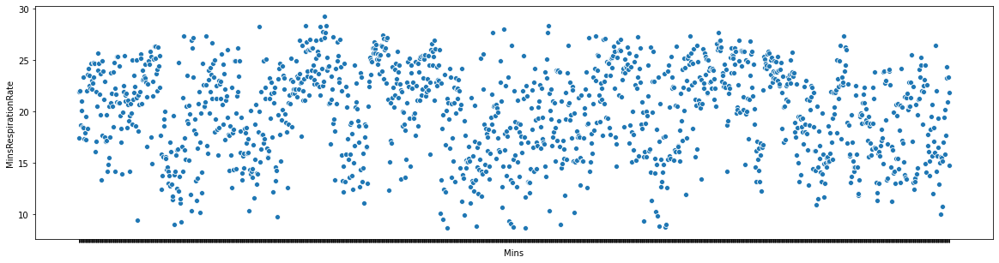

In [34]:
plt.figure(figsize=(20,5))
g = sns.scatterplot(x="Mins", y="MinsRespirationRate", data=dfpatient)
g.set(xticks=dfpatient['Mins'])
g.set_xticklabels(g.get_xticklabels(), visible=True, rotation=90)

TypeError: set_xticklabels() missing 1 required positional argument: 'labels'

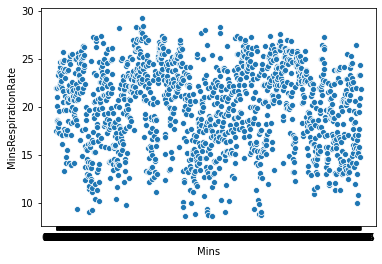

In [26]:
 sns.scatterplot(x="Mins", y="MinsRespirationRate", data=dfpatient)

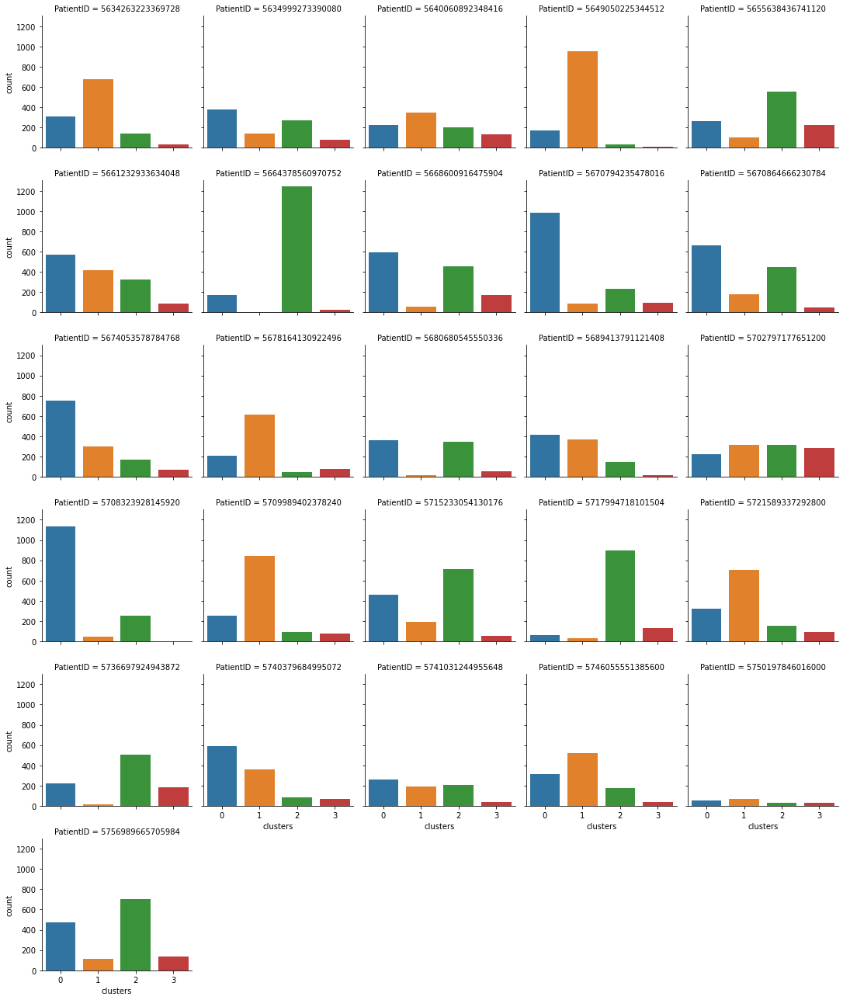

In [13]:
sns.catplot('clusters',col="PatientID", data=df,col_wrap=5,kind="count",height=3, aspect=1)


In [ ]:
g=sns.catplot(x="Mins", y='MinsRespirationRate', hue='clusters',
              col="PatientID", data=df,col_wrap=5).set(xticks=df.loc[df['PatientID'] == 5634263223369728, 'Mins'].values)
for ax in g.axes:
    plt.setp(ax.get_xticklabels(), visible=True, rotation=90)

In [ ]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsMovementSlow', hue='clusters',
              col="PatientID", data=df,col_wrap=5, kind="scatter").set(xticks=df.loc[df['PatientID'] == 5634263223369728, 'Mins'].values)

for ind, label in enumerate(g.get_xticklabels()):
    if ind % 60 == 0:  # every 10th label is kept
        label.set_visible(True)
    else:
        label.set_visible(False)
#for ax in g.axes:
    #plt.setp(ax.get_xticklabels(), visible=True, rotation=90)

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
       

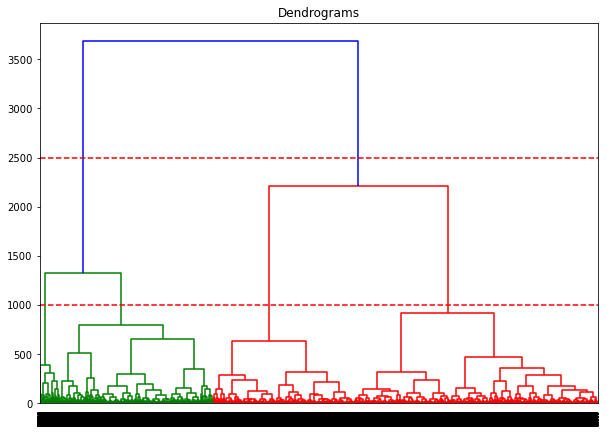

In [88]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = sch.dendrogram(sch.linkage(X, method='ward'))
plt.axhline(y=1000, color='r', linestyle='--')
plt.axhline(y=2500, color='r', linestyle='--')

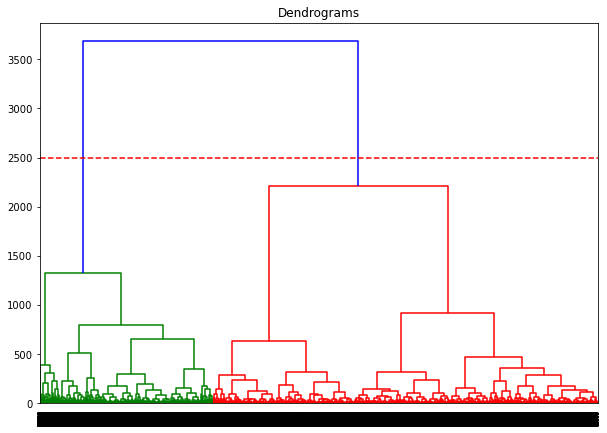

In [87]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = sch.dendrogram(sch.linkage(X, method='ward'))
plt.axhline(y=2500, color='r', linestyle='--')

In [ ]:
# import hierarchical clustering libraries
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
# create dendrogram
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'))

In [82]:
# create clusters
hc = AgglomerativeClustering(n_clusters=2, affinity = 'euclidean', linkage = 'ward')
# save clusters for chart
y_hc = hc.fit_predict(X)

In [83]:
df['clusterH3']=y_hc

00:01:34.71


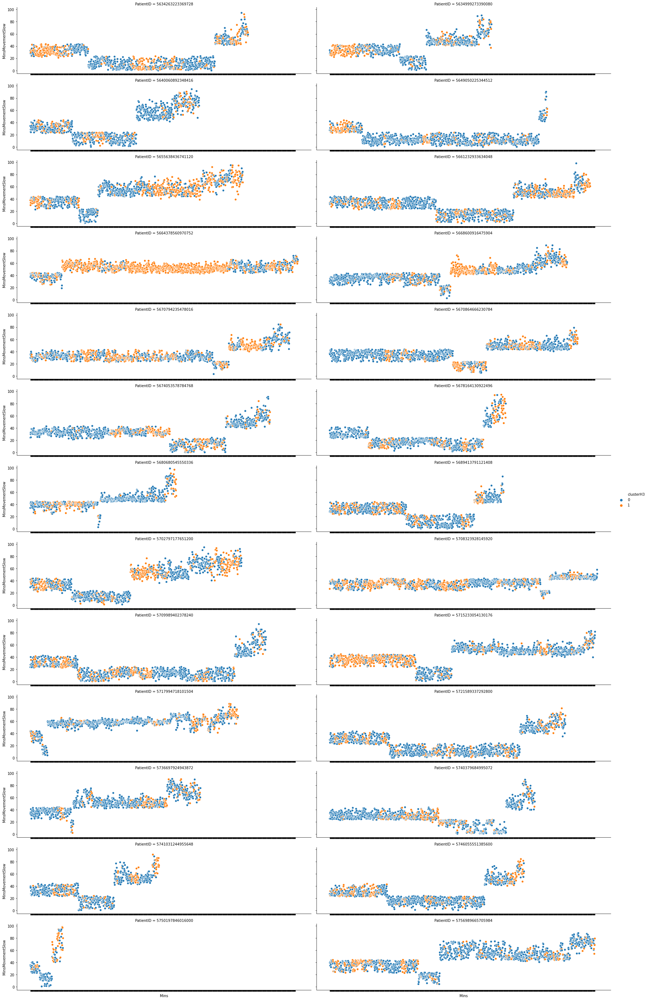

In [84]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsMovementSlow', hue='clusterH3',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
g.set(xticklabels=[])

00:01:34.70


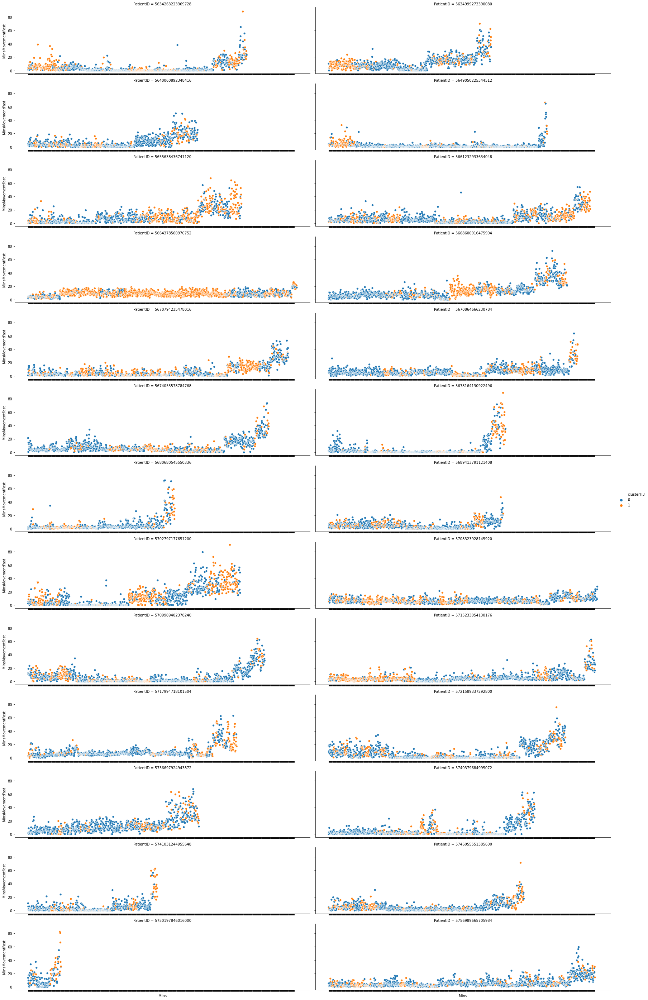

In [85]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsMovementFast', hue='clusterH3',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:01:34.18


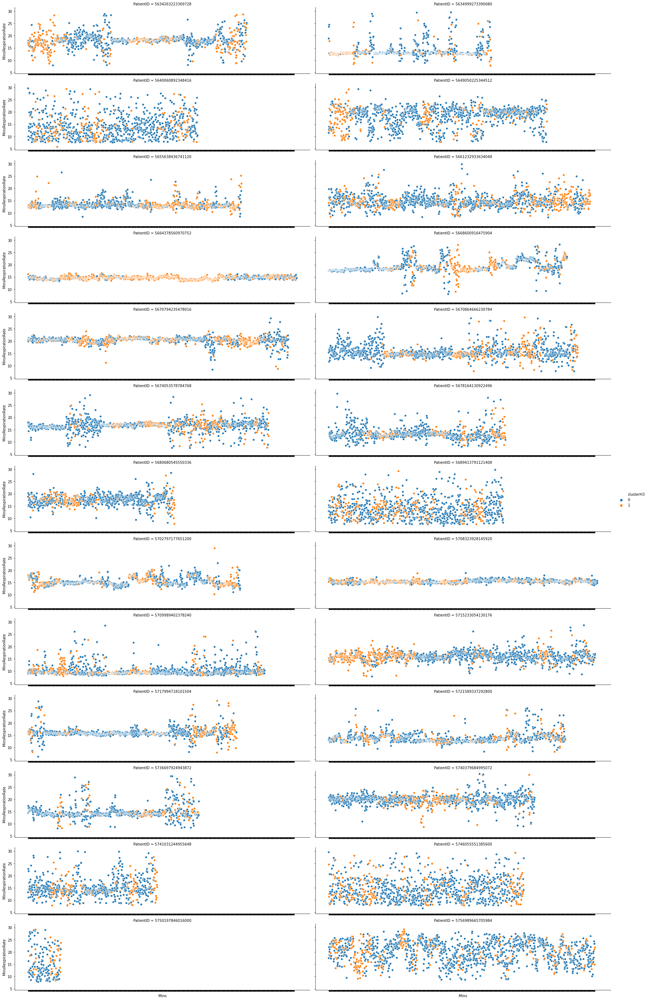

In [86]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsRespirationRate', hue='clusterH3',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:01:30.93


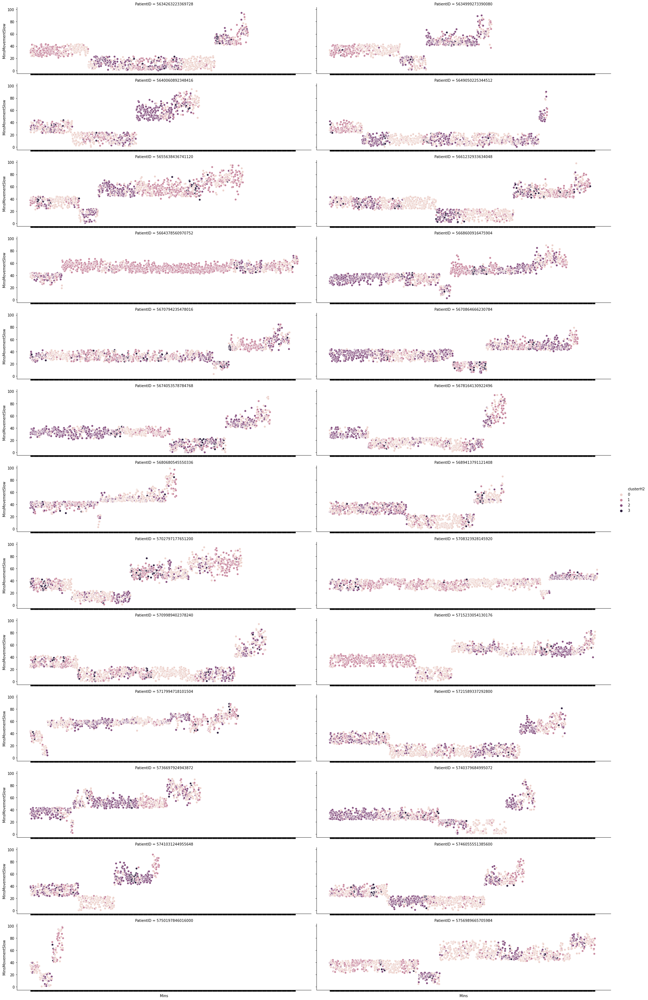

In [76]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsMovementSlow', hue='clusterH2',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
g.set(xticklabels=[])

00:01:30.96


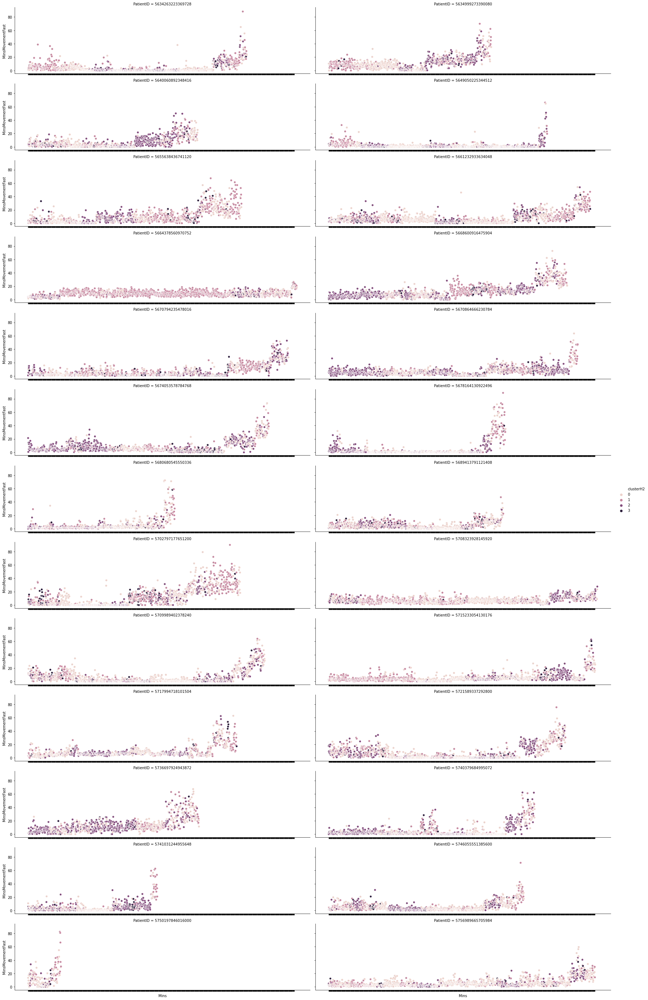

In [77]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsMovementFast', hue='clusterH2',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

In [63]:
#df['min']=df['Mins'].apply(lambda x: x.split(':')[0])
df=df.drop(columns='min')

KeyboardInterrupt: 

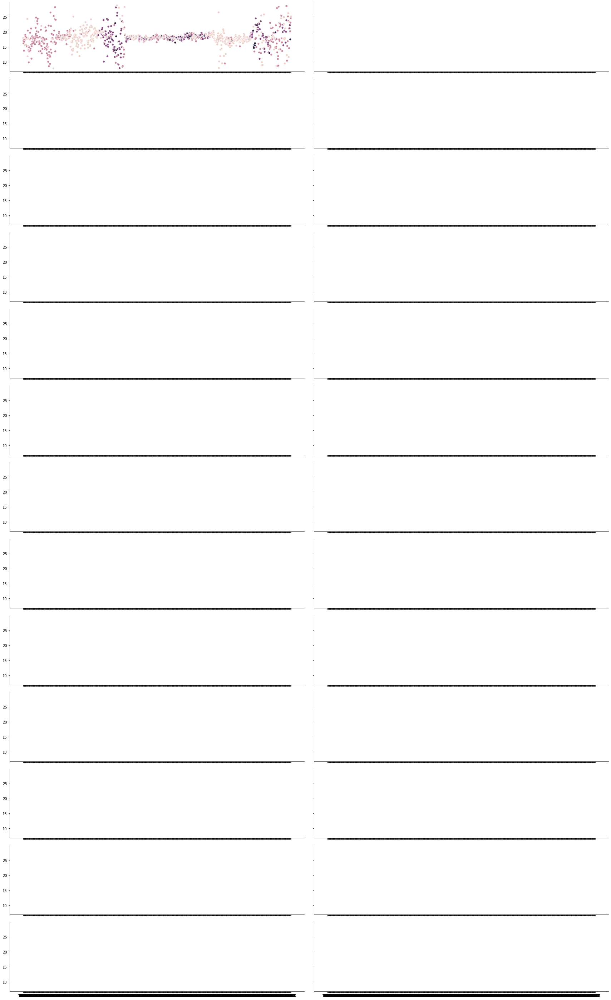

In [78]:
start=time.time()
g=sns.relplot(x="Mins", y='MinsRespirationRate', hue='clusterH2',
              col="PatientID", data=df,col_wrap=2, kind="scatter",height=3, aspect=4)
g.set(xticklabels=[])
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

In [ ]:
sns.catplot('clusterH2',col="PatientID", data=df,col_wrap=5,kind="count",height=3, aspect=1)

In [38]:
dfh=pd.read_csv(r'C:\Users\chunxiacao\keenly\keenhours.csv',header=0)

00:00:00.58


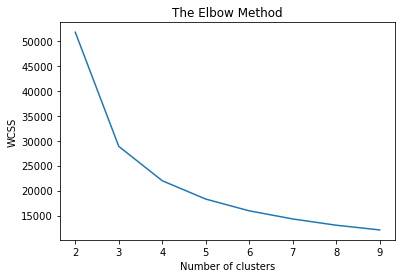

In [39]:
X=dfh[['MovementFast', 'MovementSlow',       'RespirationRate']]

start = time.time()
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline

#plt.figure(figsize=(5, 3))
wcss = []
for i in range(2,10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_) #criterion based on which K-means clustering works
plt.plot(range(2,10), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
#plt.annotate(xy=(5,2.5),xytext = (5,3.5),s='Elbow', arrowprops={})
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:00:00.66


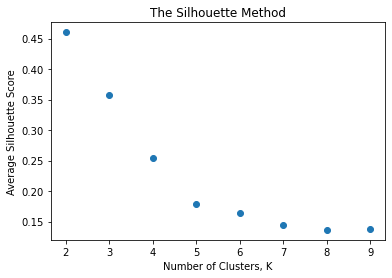

In [40]:
start = time.time()
# checking the best number of clusters (silhouette method)
sil=[]
for K in range(2,10):
   
    kmeans = KMeans(n_clusters=K)
    
    kmeans.fit(normalize(X))
    labels = kmeans.labels_
    sil.append(silhouette_score(X, labels, metric='euclidean'))

plt.scatter(range(2,10),sil,marker = 'o')
plt.xlabel('Number of Clusters, K')
plt.ylabel('Average Silhouette Score')
plt.title('The Silhouette Method')
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

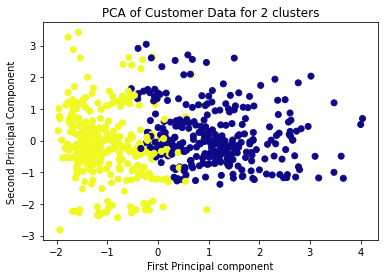

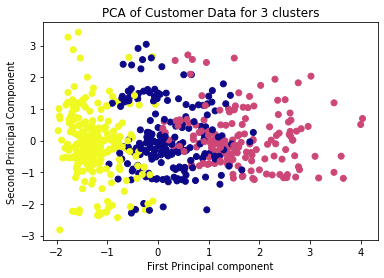

00:00:00.49


In [42]:
start = time.time()
for K in range(2,4):
    model = KMeans(n_clusters = K)
    model.fit_predict(X)
    pred=model.predict(X)
    #rescaling the data: scaled
    features = X
    scaler = StandardScaler()
    scaler.fit(features)
    scaled=scaler.transform(features)
    #initiating PCA classifier: pca
    pca = PCA(n_components=K);
    #fitting the scaled data
    pca.fit(scaled);
    #transforming fitted data into an array: x_pca
    x_pca = pca.transform(scaled)
    #creating a dataframe
    df2=pd.DataFrame({'cluster':pred,'x':x_pca[:,0],'y':x_pca[:,1]})
    df2.head()
    #plotting x,y 
    plt.scatter(df2.x,df2.y,c=df2.cluster,cmap='plasma');
    plt.xlabel('First Principal component');
    plt.ylabel('Second Principal Component');
    plt.title("PCA of Customer Data for {} clusters".format(K));
    plt.show()

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
    

In [44]:
clustersH = KMeans(4)  # 4 clustersH!
clustersH.fit( X )
clustersH.cluster_centers_
clustersH.labels_
dfh['clustersH'] = clustersH.labels_
dfh=dfh.sort_values(by=['clustersH'],ascending = True)

In [50]:
dfh.head()

,PatientID,Hours,MovementSlow,MovementFast,RespirationRate,clustersH
357,5708323928145920,4,27.54,4.79,16.05,0
120,5661232933634048,2,24.48,5.53,14.98,0
523,5741031244955648,2,16.14,3.48,16.04,0
122,5661232933634048,4,25.59,4.95,14.47,0
123,5661232933634048,5,22.63,3.29,13.34,0


00:00:07.11


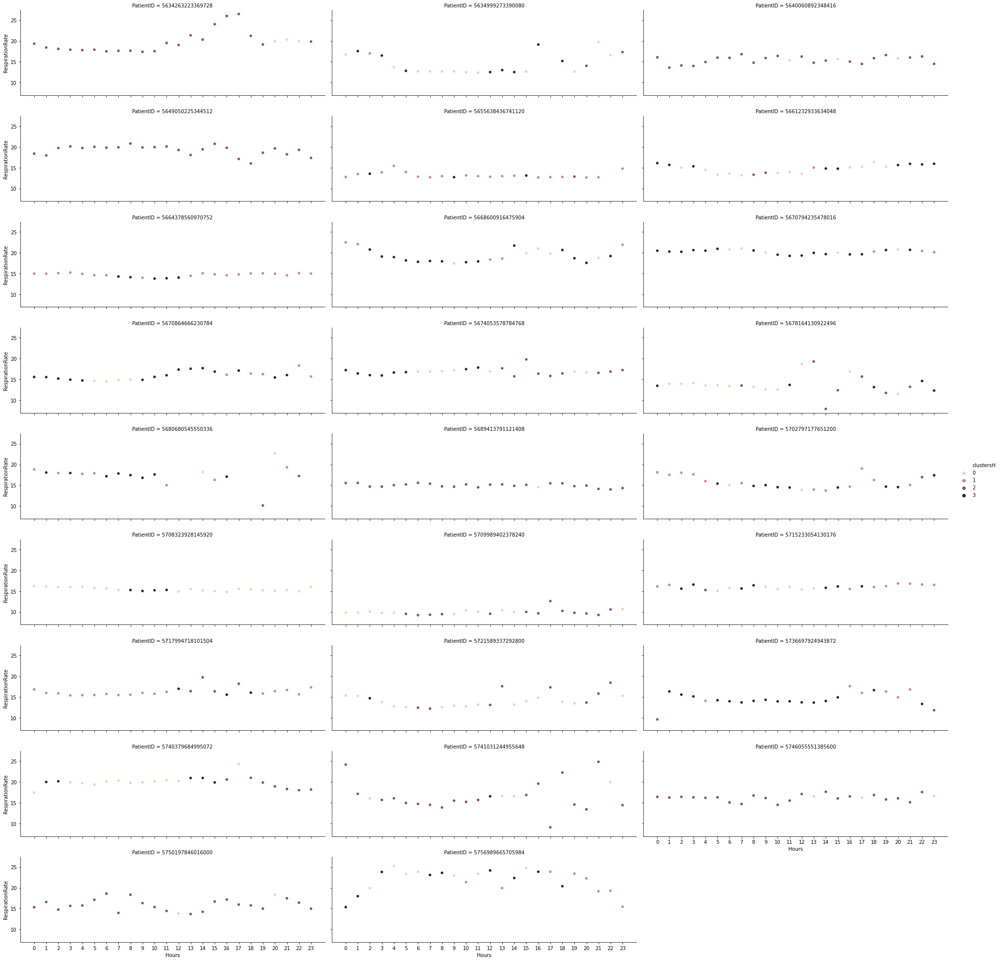

In [54]:
start=time.time()
g=sns.relplot(x="Hours", y='RespirationRate', hue='clustersH',
              col="PatientID", data=dfh,col_wrap=3, kind="scatter",height=3, aspect=3)
g.set(xticks=dfh.loc[dfh['PatientID'] == 5634263223369728, 'Hours'].values)

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:00:08.13


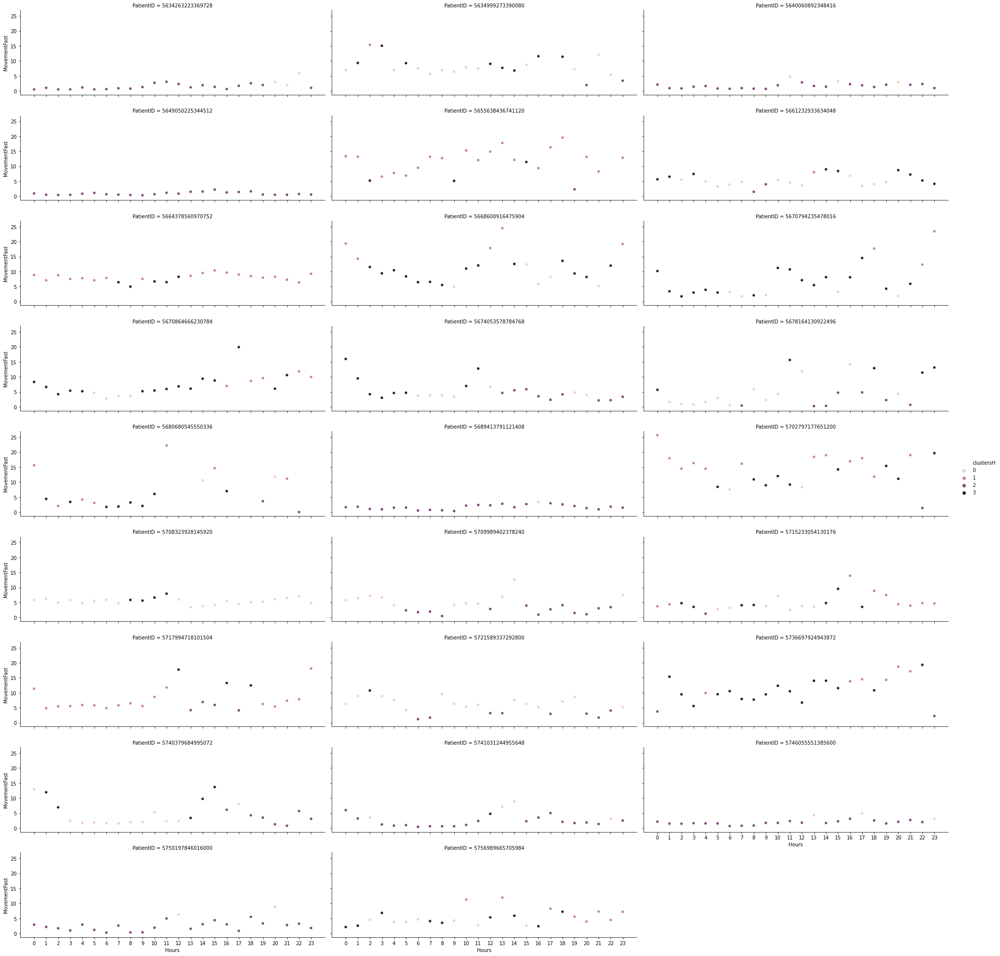

In [55]:
start=time.time()
g=sns.relplot(x="Hours", y='MovementFast', hue='clustersH',
              col="PatientID", data=dfh,col_wrap=3, kind="scatter",height=3, aspect=3)
g.set(xticks=dfh.loc[dfh['PatientID'] == 5634263223369728, 'Hours'].values)

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:00:08.49


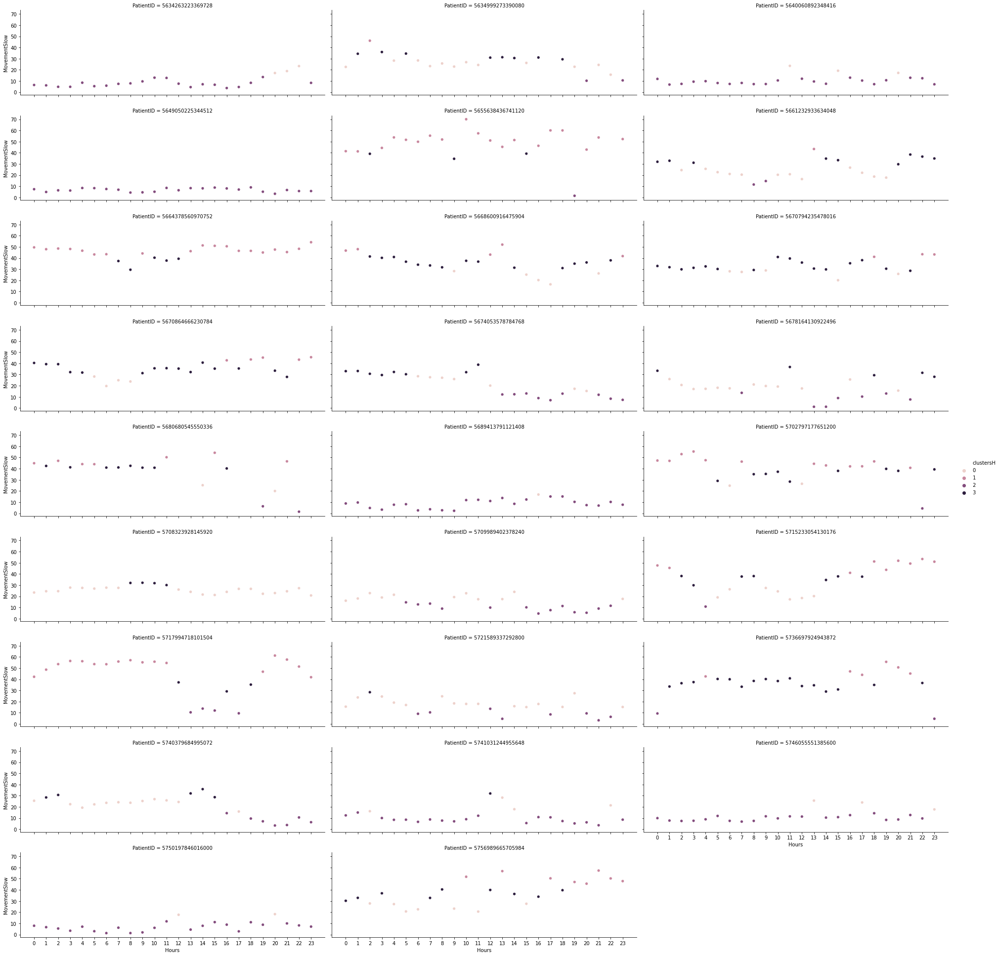

In [56]:
start=time.time()
g=sns.relplot(x="Hours", y='MovementSlow', hue='clustersH',
              col="PatientID", data=dfh,col_wrap=3, kind="scatter",height=3, aspect=3)
g.set(xticks=dfh.loc[dfh['PatientID'] == 5634263223369728, 'Hours'].values)

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

In [ ]:
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.axhline(y=100, color='r', linestyle='--')

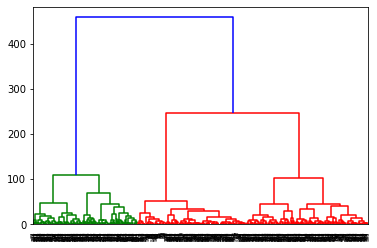

In [57]:
# import hierarchical clustering libraries
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
# create dendrogram
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'))
# create clusters
hch = AgglomerativeClustering(n_clusters=4, affinity = 'euclidean', linkage = 'ward')
# save clusters for chart
y_hch = hch.fit_predict(X)


In [ ]:
hch = AgglomerativeClustering(n_clusters=3, affinity = 'euclidean', linkage = 'ward')
# save clusters for chart
y_hch = hch.fit_predict(X)

In [58]:
dfh['clustersHh']=y_hch

00:00:07.56


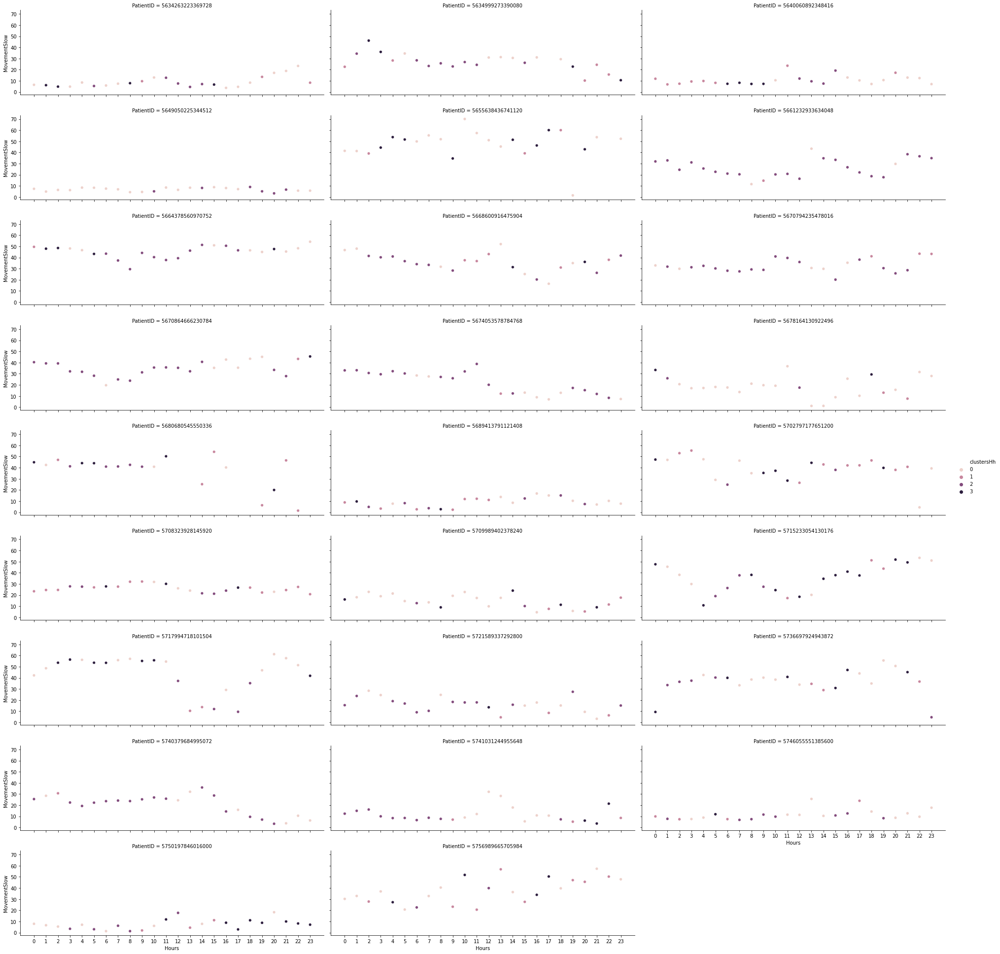

In [59]:
start=time.time()
g=sns.relplot(x="Hours", y='MovementSlow', hue='clustersHh',
              col="PatientID", data=dfh,col_wrap=3, kind="scatter",height=3, aspect=3)
g.set(xticks=dfh.loc[dfh['PatientID'] == 5634263223369728, 'Hours'].values)

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

00:00:08.01


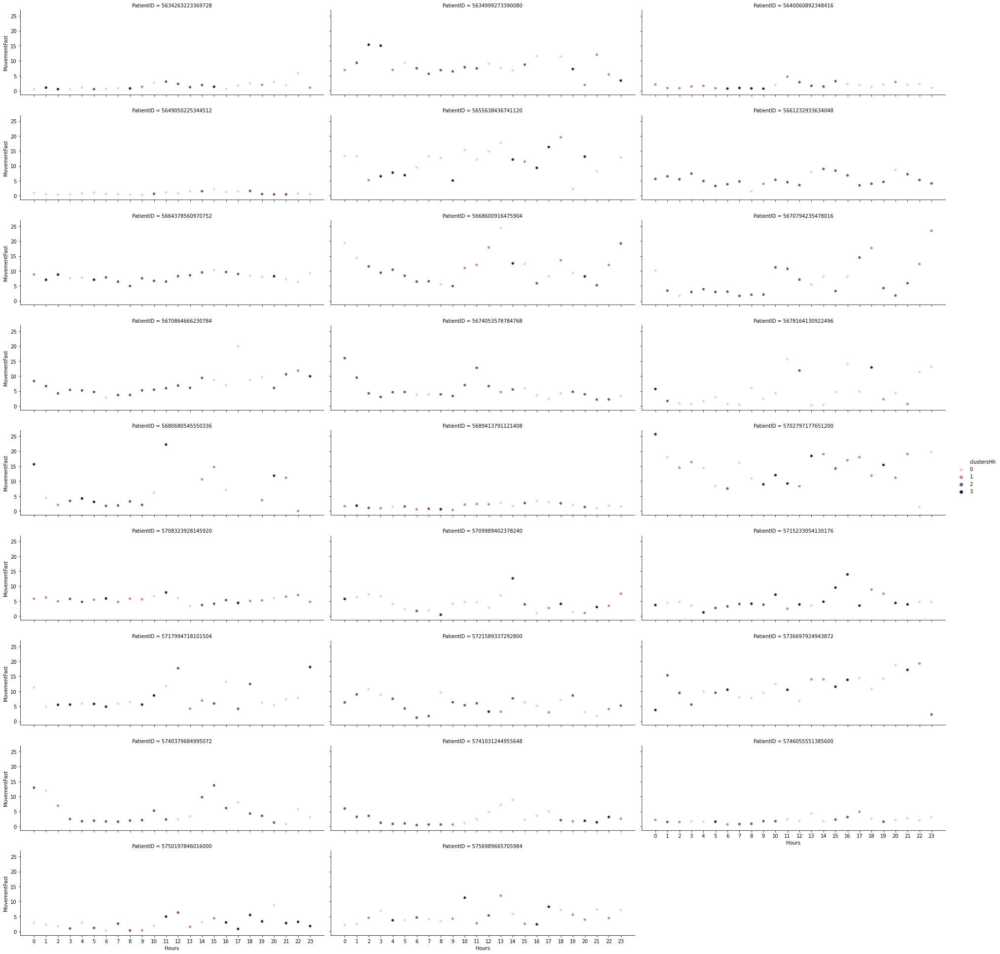

In [60]:
start=time.time()
g=sns.relplot(x="Hours", y='MovementFast', hue='clustersHh',
              col="PatientID", data=dfh,col_wrap=3, kind="scatter",height=3, aspect=3)
g.set(xticks=dfh.loc[dfh['PatientID'] == 5634263223369728, 'Hours'].values)

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))